In [1]:
import cv2 as cv
import os
import matplotlib.pyplot as plt
import numpy as np
import math
import pulp as plp

In [2]:
trainImagesPath = "train_new"
testImagesPath = "test_new"
resultsPath = "results"
imageType = "jpg"

In [3]:
def showImage(image):
    plt.imshow(image, cmap='gray')
    plt.show()

In [4]:
class Loader:
    def __init__(self, path):
        self.images = []
        self.path = path
        self.sudokus = []
    def load(self):
        files = os.listdir(self.path)
        for file in files:
            if file[-3:] == imageType:
                img = cv.imread(os.path.join(self.path, file))
                self.images.append(img)
            elif file[-3:] == "txt":
                sudoku = []
                with open(os.path.join(self.path, file)) as f:
                    for line in f:
                        sudoku.append(line)
                self.sudokus.append(sudoku)
        return self.images, self.sudokus
    

In [5]:
Xtrain, Ytrain = Loader(trainImagesPath).load()
Xtest, _ = Loader(testImagesPath).load()

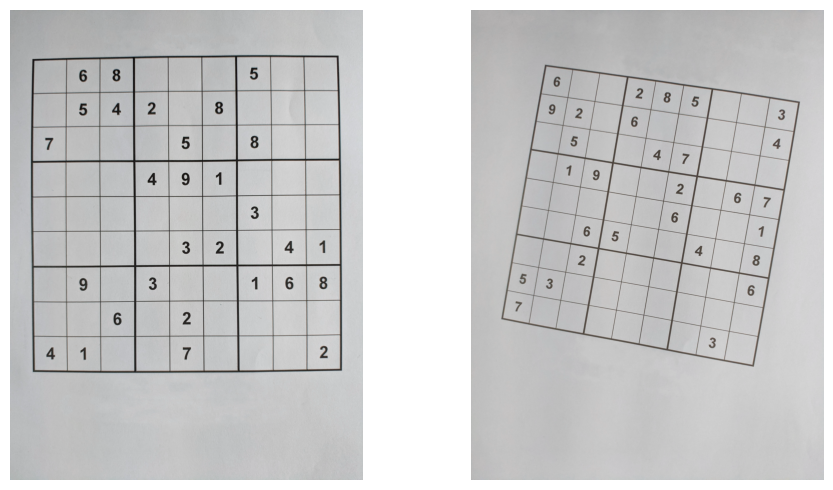

In [526]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(Xtrain[0])
axs[0].axis('off')  

axs[1].imshow(Xtest[0])
axs[1].axis('off')

plt.tight_layout()

plt.show()

In [22]:
class Preprocess:
    def __init__(self, image):
        self.originalImage = image
        self.sudokuGrid = None
        h, w, ch = image.shape
        border_size = 10
        cropped_height = h - 2 * border_size
        cropped_width = w - 2 * border_size
        cropped_image = image[border_size: border_size + cropped_height, border_size: border_size + cropped_width]
        self.image = cropped_image
        self.cellsPositions = [[() for _ in range(9)] for _ in range(9)]
        self.inverse_M = None


    def binarize(self):
        processedImage = cv.cvtColor(self.image, cv.COLOR_BGR2GRAY)
        _, processedImage = cv.threshold(processedImage, 127, 255, cv.THRESH_BINARY_INV)

        return processedImage

    def getContours(self):
        processedImage = self.binarize()
        # Get maximum contour RETR_EXTERNAL
        contours, hierarchy = cv.findContours(processedImage, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
        maximumPerimeter = -1
        sudokuGrid = None
        corners = None

        for contour in contours:
            perimeter = cv.arcLength(contour, True)
            approx = cv.approxPolyDP(contour, 0.02 * perimeter, True)

            if len(approx) == 4:
                if perimeter > maximumPerimeter:
                    corners = approx
                    maximumPerimeter = perimeter
                    sudokuGrid = contour


        # Corners in trygonometric order
        corners = cv.convexHull(corners)

        # Select up-left corner based on minimum distance to origin
        index_min = np.argmin(np.array([c[0][0] ** 2 + c[0][1] ** 2 for c in corners]))

        # Put first the top left corner
        corners = np.concatenate((corners[index_min:], corners[:index_min]))
        processedImage = cv.drawContours(self.image.copy(), [sudokuGrid], -1, (0, 255, 0), 3)

        return corners, processedImage

    def getGridAsSquare(self):
        corners, _ = self.getContours()

        # Map to float
        src = np.float32([c[0] for c in corners])
        # print(corners)
        # Get width and height of the board
        width = max(int(np.round(np.linalg.norm(np.array([[corners[0][0][0] - corners[1][0][0], corners[0][0][1] - corners[1][0][1]]])))), int(np.round(np.linalg.norm(np.array([[corners[2][0][0] - corners[3][0][0], corners[2][0][1] - corners[3][0][1]]])))))
        height = max(int(np.round(np.linalg.norm(np.array([[corners[0][0][0] - corners[3][0][0], corners[0][0][1] - corners[3][0][1]]])))), int(np.round(np.linalg.norm(np.array([[corners[1][0][0] - corners[2][0][0], corners[1][0][1] - corners[2][0][1]]])))))
        # print(width, height)
        dst_pts = np.float32([[0, 0], [width, 0], [width, height], [0, height]])

        # Get transform matrix
        M = cv.getPerspectiveTransform(src, dst_pts)
        # Get inverse transform matrix in order to print the numbers
        self.inverse_M = cv.getPerspectiveTransform(dst_pts, src)
        sudoku = cv.warpPerspective(self.image, M, (width, height))

        self.sudokuGrid = sudoku
        self.saveSudokuGrid = sudoku
        return width, height, sudoku

    def getCells(self):
        width, height, sudokuGrid = self.getGridAsSquare()
        border_size = 10

        h, w, ch = sudokuGrid.shape
        # Add border to properly get the lines from the border
        bordered_image = np.zeros((h + 2 * border_size, w + 2 * border_size, ch), dtype=np.uint8)
        bordered_image[border_size:border_size + height, border_size:border_size + width] = sudokuGrid
        bordered_image_forInitial = np.zeros((h + 2 * border_size, w + 2 * border_size, ch), dtype=np.uint8)
        bordered_image_forInitial[border_size:border_size + height, border_size:border_size + width] = self.sudokuGrid
        self.sudokuGrid = bordered_image_forInitial
        grid = np.zeros(bordered_image.shape, dtype=np.uint8)

        processedImage = cv.cvtColor(bordered_image, cv.COLOR_BGR2GRAY)
        processedImage = cv.GaussianBlur(processedImage, (3, 3), 0)
        _, processedImage = cv.threshold(processedImage, 127, 255, cv.THRESH_BINARY_INV)
        processedImage = cv.Canny(processedImage, threshold1=50, threshold2=100)

        # Get all contours RETR_TREE
        contours, hierarchy = cv.findContours(processedImage, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        processedImage = cv.drawContours(grid, contours, -1, (255, 255, 255), 3)
        return processedImage


    def getEdges(self, img):
        processedImage = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        _, processedImage = cv.threshold(processedImage, 127, 255, cv.THRESH_BINARY_INV)
        processedImage = cv.Canny(processedImage, threshold1=50, threshold2=100)
        return processedImage

    def drawLines(self, lines, col, img):
        newImage = img.copy()
        for line in lines:
            rho = line[0][0]
            theta = line[0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 10000 * (-b)), int(y0 + 10000 * (a)))
            pt2 = (int(x0 - 10000 * (-b)), int(y0 - 10000 * (a)))

            newImage = cv.line(img, pt1, pt2, col, 3, cv.LINE_AA)

        return newImage

    def cleanLines(self, lines):
        i = 0
        cleanLines = []
        # Extract lines that have similar rhos
        while i < len(lines):
            j = i
            rho = lines[i][0][0]
            group = []
            while j < len(lines) and lines[j][0][0] - rho < 50:
                group.append(lines[j])
                rho = lines[j][0][0]
                j += 1
            cleanLines.append(group[len(group) // 2])
            i = j - 1
            i += 1

        return cleanLines
    def getLines(self):
        sudoku = self.getCells()
        canny = self.getEdges(sudoku)

        lines = cv.HoughLines(canny, 1, 3 * np.pi / 180, threshold=300)
        horizontalLines = []
        verticalLines = []
        if lines is not None:
            for i in range(len(lines)):
                rho = lines[i][0][0]
                theta = lines[i][0][1]

                # Vertical lines
                if theta < np.pi / 10 or theta > np.pi - np.pi / 10:
                    verticalLines.append(lines[i])
                elif np.abs(theta - np.pi / 2) < np.pi / 10:
                    horizontalLines.append(lines[i])
                else:
                    pass



        verticalLines = np.array(sorted(verticalLines, key=lambda line : line[0][0]))
        horizontalLines = np.array(sorted(horizontalLines, key=lambda line : line[0][0]))

        # Clean lines
        cleanVerticalLines = self.cleanLines(verticalLines)
        cleanHorizontalLines = self.cleanLines(horizontalLines)



        imageWithLines = self.drawLines(cleanVerticalLines, (255, 0, 0), self.sudokuGrid)
        imageWithLines = self.drawLines(cleanHorizontalLines, (0, 0, 255), imageWithLines)
        
        assert len(cleanHorizontalLines) == 10 and len(cleanVerticalLines) == 10, "Actual values {}, {}".format(len(cleanHorizontalLines), len(cleanVerticalLines))

        return cleanVerticalLines, cleanHorizontalLines, imageWithLines

    def intersect(self, line1, line2):
        rho1, theta1 = line1[0]
        rho2, theta2 = line2[0]
        A = np.array([[np.cos(theta1), np.sin(theta1)], [np.cos(theta2), np.sin(theta2)]])
        b = np.array([[rho1], [rho2]])
        x0, y0 = np.linalg.solve(A, b)
        x0, y0 = int(np.round(x0)), int(np.round(y0))
        return (x0, y0)

    def distance(self, pointA, pointB):
        return np.linalg.norm(np.array([pointA[0] - pointB[0], pointA[1] - pointB[1]]))

    def computeIntersectionPoints(self):
        verticalLines, horizontalLines, _ = self.getLines()

        imageWithPoints = self.sudokuGrid.copy()

        gridVerticalLines = verticalLines
        gridHorizontalLines = horizontalLines
        allIntersections = []

        for vertical in gridVerticalLines:
            intersections = []
            for horizontal in gridHorizontalLines:
                point = np.array(self.intersect(vertical, horizontal))
                intersections.append(point)

            allIntersections.append(intersections)
            for point in intersections:
                imageWithPoints = cv.circle(imageWithPoints, point, 30, (255, 0, 0), thickness=-1)

        cnt = 0
        cells = np.array([[None for _ in range(len(allIntersections) - 1)] for _ in range(len(allIntersections) - 1)])


        for i in range(len(allIntersections) - 1):
            for j in range(len(allIntersections[i]) - 1):
                cnt += 1
                resizeMargin = 30
                UL = allIntersections[i][j]
                UL = (UL[0] + resizeMargin, UL[1] + resizeMargin)

                BR = allIntersections[i+1][j+1]
                BR = (BR[0] - resizeMargin, BR[1] - resizeMargin)


                cells[j, i] = self.sudokuGrid[UL[1] : BR[1], UL[0]: BR[0]].copy()
                self.cellsPositions[j][i] = (UL, BR)

                imageWithPoints = cv.rectangle(imageWithPoints, UL, BR, (255, 0, 0), 5)

        assert cnt == 81, "Not found all cells"
        return cells, imageWithPoints

    def drawResult(self, sudokuGame, whereToWrite):
        copie = self.saveSudokuGrid.copy()
        for i in range(0, 9):
            for j in range(0, 9):
                if not whereToWrite[i, j]:
                    UL = self.cellsPositions[i][j][0]
                    BR = self.cellsPositions[i][j][1]

                    text = str(sudokuGame[i, j])
                    font = cv.FONT_HERSHEY_SIMPLEX
                    font_scale = 5
                    font_color = (255, 0, 0)
                    th = 3

                    text_size = cv.getTextSize(text, font, font_scale, th)[0]
                    pos = ((UL[0] + BR[0]) // 2 - text_size[0] // 2, (UL[1] + BR[1]) // 2 + text_size[1] // 2)

                    copie = cv.putText(copie, text, pos, font, font_scale, font_color, th)
        return copie

    def getAugmentedImage(self, sudokuGame, whereToWrite):
        height, width = self.originalImage.shape[:2]
        img = self.drawResult(sudokuGame, whereToWrite)
        mask = np.ones_like(img, dtype=np.uint8) * 255
        showImage(img)
        mask = cv.warpPerspective(mask, self.inverse_M, (width, height))
        final = cv.warpPerspective(img, self.inverse_M, (width, height))
        final = final[0:self.image.shape[0], 0:self.image.shape[1], :]
        showImage(final)
        mask = 255 - mask[0:self.image.shape[0], 0:self.image.shape[1], :]
        showImage(mask)
        result = np.zeros_like(self.image)
        w, h, _ = self.image.shape
        for i in range(w):
            for j in range(h):
                if mask[i, j, 0] == 255 and mask[i, j, 1] == 255 and mask[i, j, 2] == 255:
                    result[i,j] = self.image[i,j]
                else:
                    result[i,j] = final[i,j]

        return result

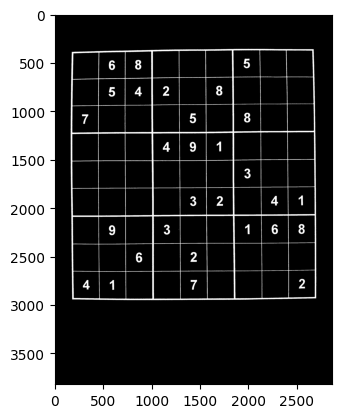

True

In [560]:
preprocess = Preprocess(Xtrain[0])
binarized = preprocess.binarize()
showImage(binarized)
output_filename = f'1-train_binarized.jpg'
output_path = os.path.join(resultsPath, output_filename)
cv.imwrite(output_path, binarized)

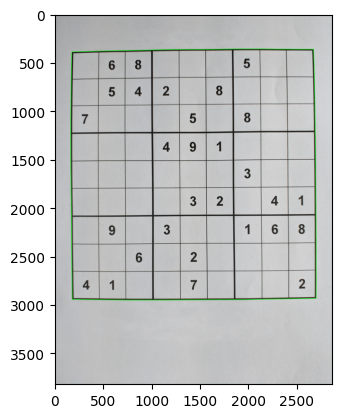

True

In [561]:
corners, processedImage = preprocess.getContours()
showImage(processedImage)
output_filename = f'1-train_board_countour.jpg'
output_path = os.path.join(resultsPath, output_filename)
cv.imwrite(output_path, processedImage)

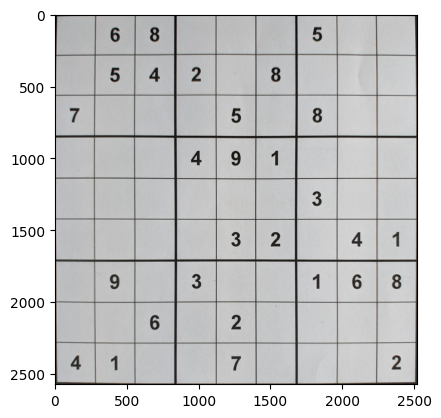

True

In [562]:
width, height, sudokuGrid = preprocess.getGridAsSquare()
showImage(sudokuGrid)
output_filename = f'1-train_board_countour_crop.jpg'
output_path = os.path.join(resultsPath, output_filename)
cv.imwrite(output_path, sudokuGrid)

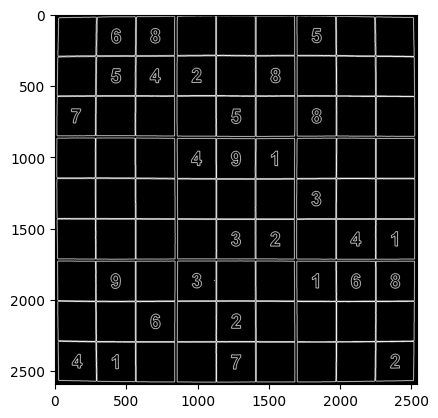

True

In [564]:
cells = preprocess.getCells()
showImage(cells)
output_filename = f'1-train_cells_countours.jpg'
output_path = os.path.join(resultsPath, output_filename)
cv.imwrite(output_path, cells)

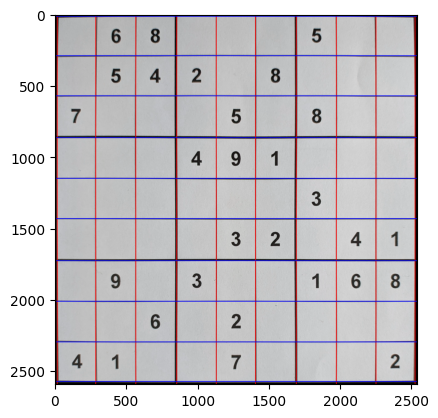

True

In [565]:
verticalLines, horizontalLines, imageWithLines = preprocess.getLines()
showImage(imageWithLines)
output_filename = f'1-train_lines_detection.jpg'
output_path = os.path.join(resultsPath, output_filename)
cv.imwrite(output_path, imageWithLines)

C:\Users\bebed\AppData\Local\Temp\ipykernel_5632\2202898834.py:181: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x0, y0 = int(np.round(x0)), int(np.round(y0))


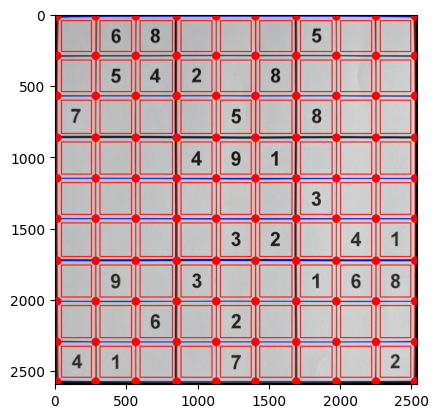

True

In [566]:
cells, intersections = preprocess.computeIntersectionPoints()
showImage(intersections)
output_filename = f'1-train_intersections.jpg'
output_path = os.path.join(resultsPath, output_filename)
cv.imwrite(output_path, intersections)

In [13]:
# https://towardsdatascience.com/solve-sudoku-using-linear-programming-python-pulp-b41b29f479f3

class Sudoku:
    def __init__(self, game):
        self.game = np.zeros((9, 9), dtype=np.uint8)

        for i in range(9):
            for j in range(9):
                if game[i][j] != 'o':
                    self.game[i, j] = int(game[i][j])


    @classmethod
    def solveSudoku(self, game):
        problem = plp.LpProblem("SolveSudoku")
        problem.setObjective(plp.lpSum(0))
        rows = range(0, 9)
        cols = range(0, 9)
        grids = [[(3 * i + k, 3 * j + l) for k in range(3) for l in range(3)] for i in range(3) for j in range(3)]
        values = range(1, 10)
        choices  = plp.LpVariable.dicts("Choice", (rows, cols, values), cat='Binary')

        # one value in each square
        for r in rows:
            for c in cols:
                problem += plp.lpSum([choices[r][c][v] for v in values]) == 1

        # each number only occur once in each row
        for v in values:
            for r in rows:
                problem += plp.lpSum([choices[r][c][v] for c in cols]) == 1

        # each number only occur once in each column
        for v in values:
            for c in cols:
                problem += plp.lpSum([choices[r][c][v] for r in rows]) == 1

        # each number only occur once in each box
        for v in values:
            for g in grids:
                problem += plp.lpSum([choices[r][c][v] for (r, c) in g]) == 1

        for i in range(0, 9):
            for j in range(0, 9):
                if game[i, j] != 0:
                    problem += choices[i][j][game[i, j]] == 1

        problem.solve()
        solution = game.copy()

        for r in rows:
            for c in cols:
                for v in values:
                    if plp.value(choices[r][c][v]) == 1:
                        solution[r, c] = v

        return solution

In [9]:
class Classifier:
    def __init__(self):
        pass

    @classmethod
    def isEmpty(self, cell):
        processedImage = cv.cvtColor(cell, cv.COLOR_BGR2GRAY)
        _, processedImage = cv.threshold(processedImage, 127, 255, cv.THRESH_BINARY_INV)
        return np.max(processedImage) == 0



In [11]:
def validate(game, cells):
    for i in range(9):
        for j in range(9):
            isEmpty = Classifier.isEmpty(cells[i, j])
            assert (isEmpty == False and game[i,j] != 0) or (isEmpty == True and game[i,j] == 0)


def splitByNumber(games, allCells):
    d = {}
    for i in range(1, 10):
        d[i] = []

    for game, cells in zip(games, allCells):
        for i in range(9):
            for j in range(9):
                isEmpty = Classifier.isEmpty(cells[i, j])
                if not isEmpty:
                    grayScaledCell = cv.cvtColor(cells[i, j], cv.COLOR_BGR2GRAY)
                    d[game[i][j]].append(grayScaledCell)

    return d

In [14]:
print("Testing train")
games = []
allCells = []
for i in range(10):
    cells, img = Preprocess(Xtrain[i]).computeIntersectionPoints()
    sudoku = Sudoku(Ytrain[i])
    validate(sudoku.game, cells)
    games.append(sudoku.game)
    allCells.append(cells)

classes = splitByNumber(games, allCells)


Testing train


C:\Users\bebed\AppData\Local\Temp\ipykernel_39264\2202898834.py:181: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x0, y0 = int(np.round(x0)), int(np.round(y0))


26


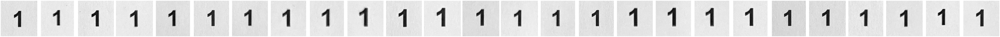

In [15]:
l = len(classes[1])
print(l)
fig, axs = plt.subplots(1, l, figsize=(5 * l, 5))

# Display each image in a separate subplot
for i in range(l):
    axs[i].imshow(classes[1][i], cmap='gray')
    axs[i].axis('off')  # Turn off axis labels

# Adjust layout for better spacing
plt.tight_layout()


38


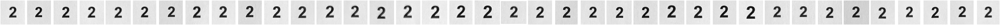

In [539]:
l = len(classes[2])
print(l)
fig, axs = plt.subplots(1, l, figsize=(5 * l, 5))

# Display each image in a separate subplot
for i in range(l):
    axs[i].imshow(classes[2][i], cmap='gray')
    axs[i].axis('off')  # Turn off axis labels

# Adjust layout for better spacing
plt.tight_layout()

37


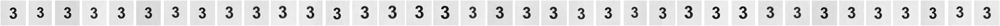

In [540]:
l = len(classes[3])
print(l)
fig, axs = plt.subplots(1, l, figsize=(5 * l, 5))

for i in range(l):
    axs[i].imshow(classes[3][i], cmap='gray')
    axs[i].axis('off')  

plt.tight_layout()

In [18]:
def getTemplate(cell):
    test = cell.copy()
    initial = test.copy()
    test = cv.cvtColor(test, cv.COLOR_BGR2GRAY)
    _, test = cv.threshold(test, 127, 255, cv.THRESH_BINARY_INV)
    rect_kernel = cv.getStructuringElement(cv.MORPH_RECT, (10, 10))
    dilation = cv.dilate(test, rect_kernel, iterations=1)
    contours, hierarchy = cv.findContours(dilation, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    x, y, w, h = cv.boundingRect(contours[0])
    roi = initial[y:y+h, x:x+w].copy()
    roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)
    
    return roi

Testing test


C:\Users\bebed\AppData\Local\Temp\ipykernel_5632\2202898834.py:181: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x0, y0 = int(np.round(x0)), int(np.round(y0))


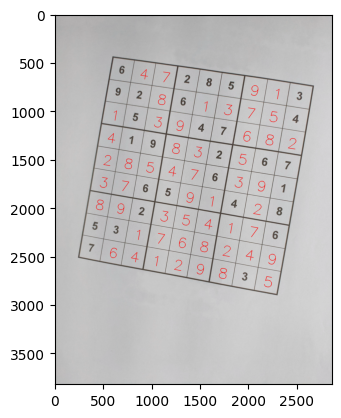

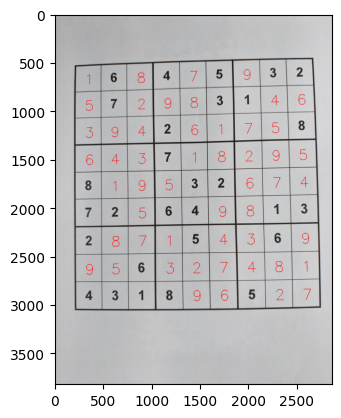

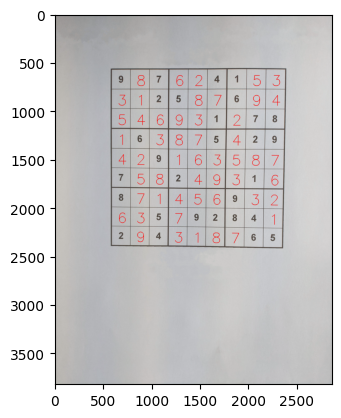

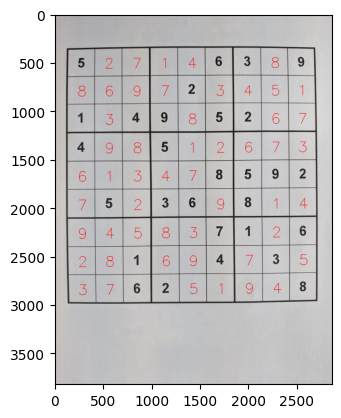

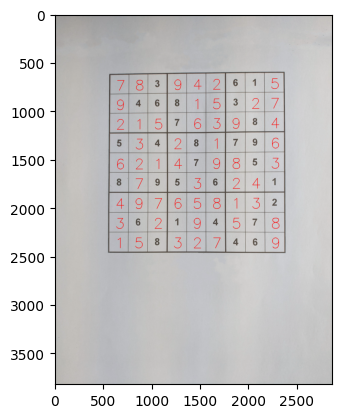

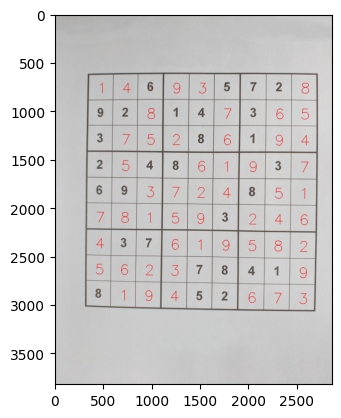

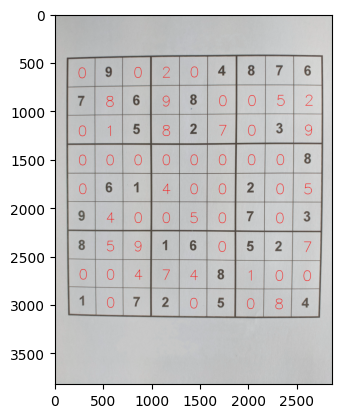

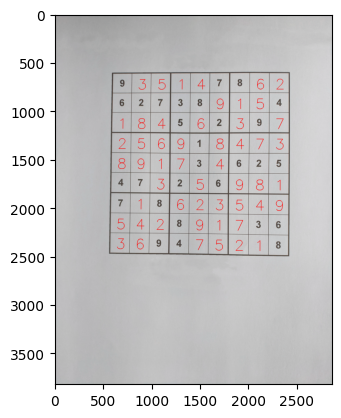

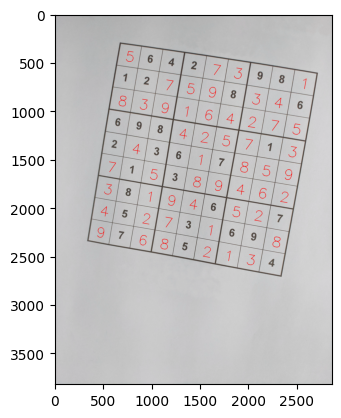

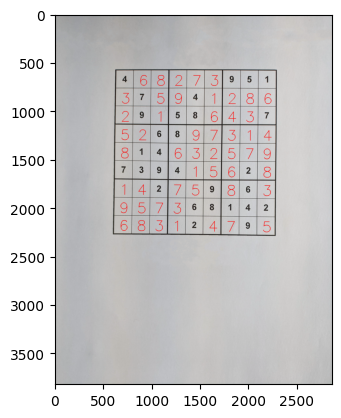

In [548]:
print("Testing test")
for index in range(10):
    processing = Preprocess(Xtest[index])
    cells, img = processing.computeIntersectionPoints()

    currentSudokuGame = np.zeros((9, 9), dtype=np.uint8)
    for i in range(9):
        for j in range(9):
            if not Classifier.isEmpty(cells[i, j]):
                template = getTemplate(cells[i,j])

                maximumValue = -1
                actualClass = -1

                for c in range(1, 10):
                    for img in classes[c]:
                        res = cv.matchTemplate(img, template, cv.TM_CCOEFF)
                        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
                        if max_val > maximumValue:
                            maximumValue = max_val
                            actualClass = c

                currentSudokuGame[i, j] = actualClass


    solution = Sudoku.solveSudoku(currentSudokuGame)
    toWrite = np.zeros((9, 9), dtype=np.uint8)
    toWrite = currentSudokuGame != 0

    img = processing.getAugmentedImage(solution, toWrite)
    output_filename = f'{index+1}-result.jpg'
    output_path = os.path.join(resultsPath, output_filename)
    showImage(img)
    cv.imwrite(output_path, img)

C:\Users\bebed\AppData\Local\Temp\ipykernel_39264\4194828966.py:181: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x0, y0 = int(np.round(x0)), int(np.round(y0))


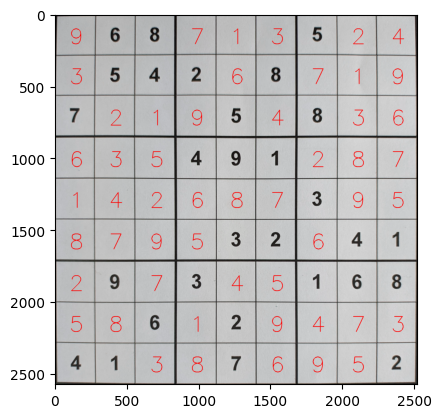

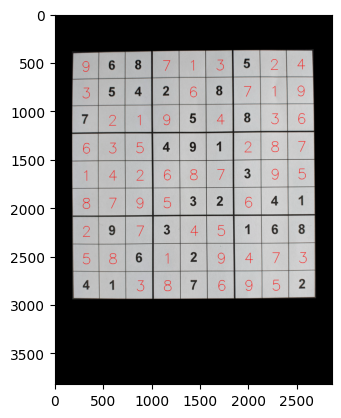

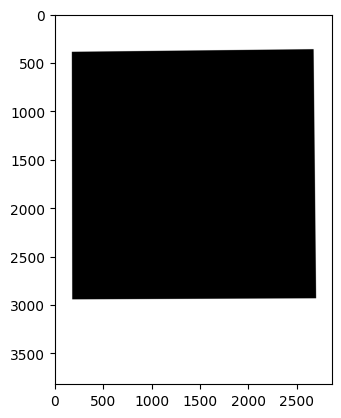

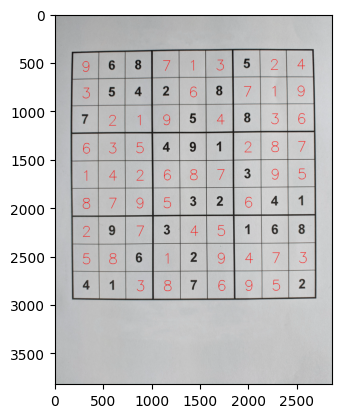

True

In [23]:

processing = Preprocess(Xtrain[0])
cells, img = processing.computeIntersectionPoints()

currentSudokuGame = np.zeros((9, 9), dtype=np.uint8)
for i in range(9):
    for j in range(9):
        if not Classifier.isEmpty(cells[i, j]):
            template = getTemplate(cells[i,j])

            maximumValue = -1
            actualClass = -1

            for c in range(1, 10):
                for img in classes[c]:
                    res = cv.matchTemplate(img, template, cv.TM_CCOEFF)
                    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
                    if max_val > maximumValue:
                        maximumValue = max_val
                        actualClass = c

            currentSudokuGame[i, j] = actualClass


solution = Sudoku.solveSudoku(currentSudokuGame)
toWrite = np.zeros((9, 9), dtype=np.uint8)
toWrite = currentSudokuGame != 0

img = processing.getAugmentedImage(solution, toWrite)
output_filename = f'1-train_result.jpg'
output_path = os.path.join(resultsPath, output_filename)
showImage(img)
cv.imwrite(output_path, img)